In [1]:
import os.path as op
import numpy as np
import matplotlib
import matplotlib.pyplot as plt
%matplotlib inline

In [2]:
import nibabel as nib
import os.path as op
import IPython.html.widgets as wdg
import IPython.display as display
from matplotlib.patches import FancyArrowPatch
from mpl_toolkits.mplot3d import proj3d
import dipy.core.geometry as geo
import matplotlib.animation as manimation


:0: FutureWarning: IPython widgets are experimental and may change in the future.


If you've already downloaded the data, you can go ahead and run the next cells. In the first cell, we define the b-vectors. These are 3D vectors, that tell us the directions in which the diffusion gradients were oriented in each of the 160 measurements that were conducted. This includes 10 vectors at the origin, `(0,0,0)`, for the non-diffusion weighted measurements that were conducted to acquire a baseline signal. The diffusion-weighted gradients are represented as unit-vectors in the directions of diffusion weighting in each of the 150 diffusion-weighting directions.

In [3]:
from dipy.data import read_stanford_hardi
img, gtab = read_stanford_hardi()

In [4]:
data = img.get_data()

In [5]:
data.shape

(81, 106, 76, 160)

In [6]:
bvecs = gtab.bvecs[~gtab.b0s_mask].T

In [7]:
class Arrow3D(FancyArrowPatch):
    def __init__(self, xs, ys, zs, *args, **kwargs):
        FancyArrowPatch.__init__(self, (0,0), (0,0), *args, **kwargs)
        self._verts3d = xs, ys, zs

    def draw(self, renderer):
        xs3d, ys3d, zs3d = self._verts3d
        xs, ys, zs = proj3d.proj_transform(xs3d, ys3d, zs3d, renderer.M)
        self.set_positions((xs[0],ys[0]),(xs[1],ys[1]))
        FancyArrowPatch.draw(self, renderer)


def plot_bvecs(elev=45, azim=45, x=40, y=50, z=35, fig=None):
    this_vec = geo.sphere2cart(1, np.deg2rad(elev), np.deg2rad(azim))
    angles = np.arccos(np.dot(this_vec, bvecs[:, 10:]))
    closest = np.argmin(angles)
    n = closest + 10
    if fig is None:
        fig = plt.figure()
    ax = fig.add_subplot(221)
    a = ax.arrow(0,0, bvecs[1][n], bvecs[0][n], linewidth=4, width=0.005, color=[np.abs(bvecs[0][n]), np.abs(bvecs[1][n]), 
                                                                    np.abs(bvecs[2][n])])
    ax.set_xlim([-1.4, 1.4])
    ax.set_ylim([-1.4, 1.4])
    #ax.add_artist(a)
    ax.axis('off')
    #for set_lim in [ax.set_xlim, ax.set_ylim, ax.set_zlim]:
    #    set_lim([-1,1])
    ax = fig.add_subplot(222)
    ax.arrow(2,2,0,10, linewidth=4, width=0.1, color='r')
    ax.arrow(2,2,10,0, linewidth=4, width=0.1, color='g')
    ax.matshow(data[:, :, z, n], cmap=matplotlib.cm.bone)
    ax.axis('off')
    ax = fig.add_subplot(223)
    ax.axis('off')
    ax.arrow(2,2,0,10, linewidth=4, width=0.1, color='b')
    ax.arrow(2,2,10,0, linewidth=4, width=0.1, color='r')
    ax.matshow(np.rot90(data[:, y, :, n]), cmap=matplotlib.cm.bone)
    ax = fig.add_subplot(224)
    ax.axis('off')
    ax.arrow(2,2,0,10, linewidth=4, width=0.1, color='b')
    ax.arrow(2,2,10,0, linewidth=4, width=0.1, color='g')
    ax.matshow(np.rot90(data[x, :, :, n]), cmap=matplotlib.cm.bone)
    fig.set_size_inches(10, 10)
    return fig

In [8]:
import moviepy.editor as mp

  max_open_warning, RuntimeWarning)



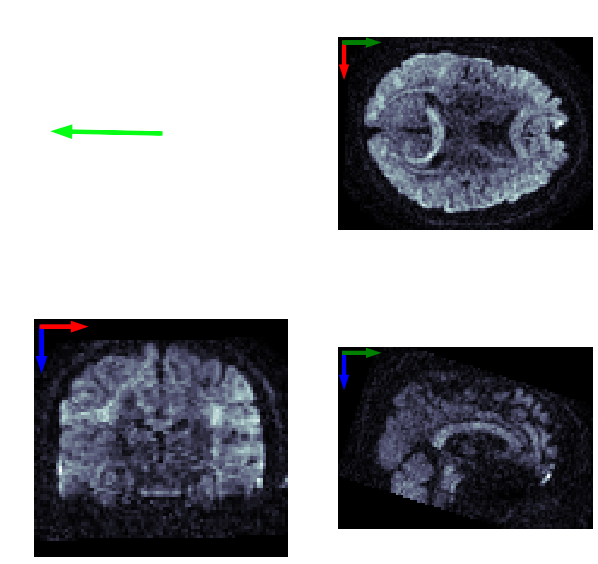

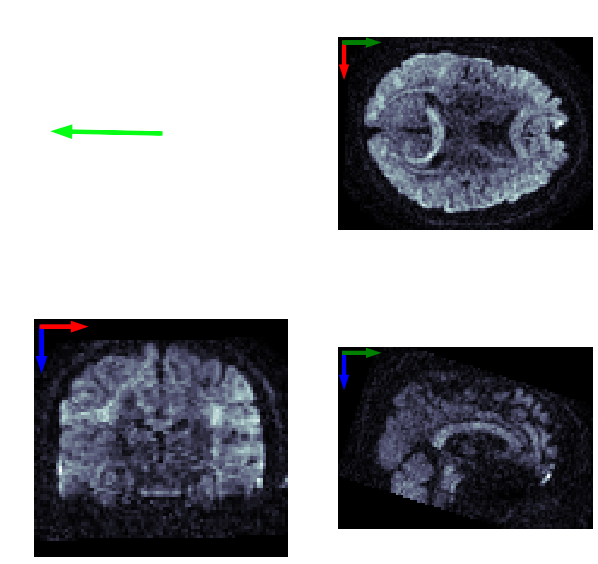

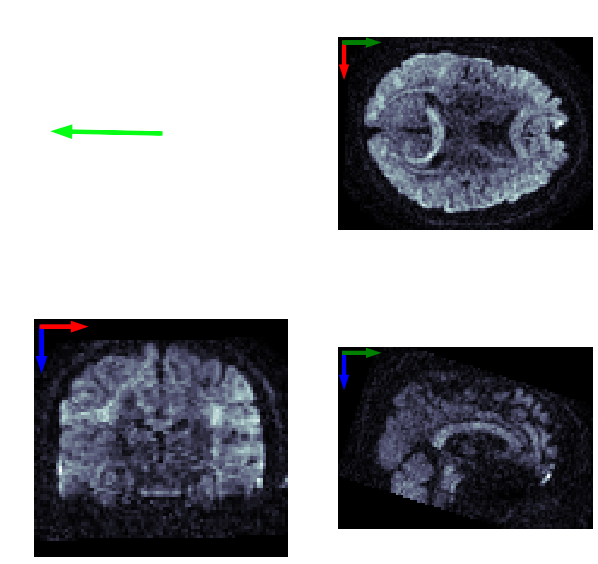

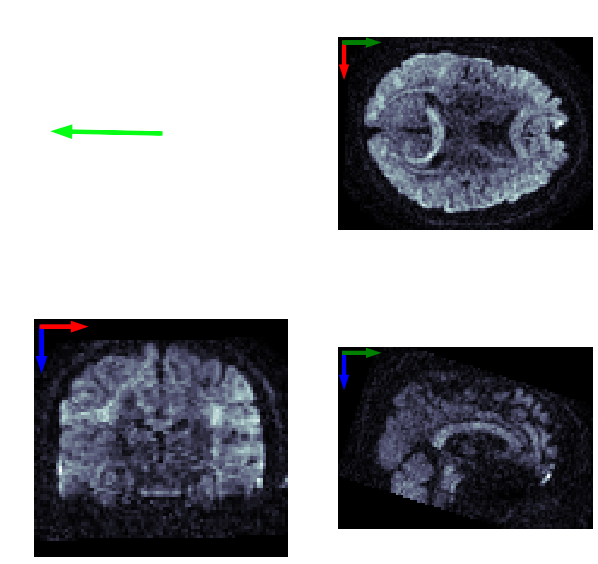

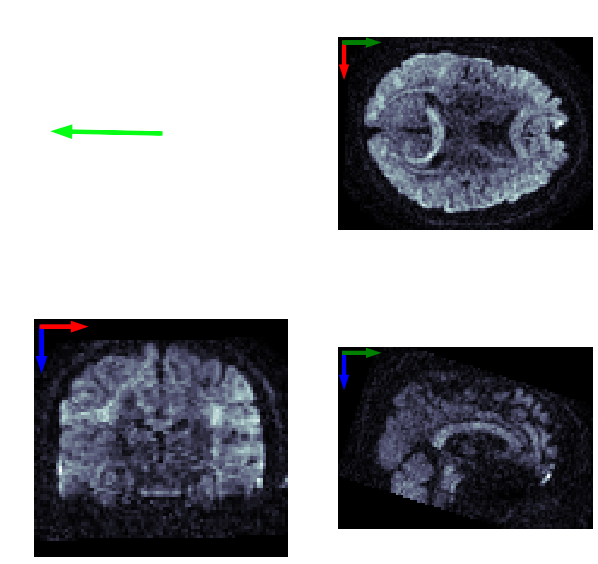

...

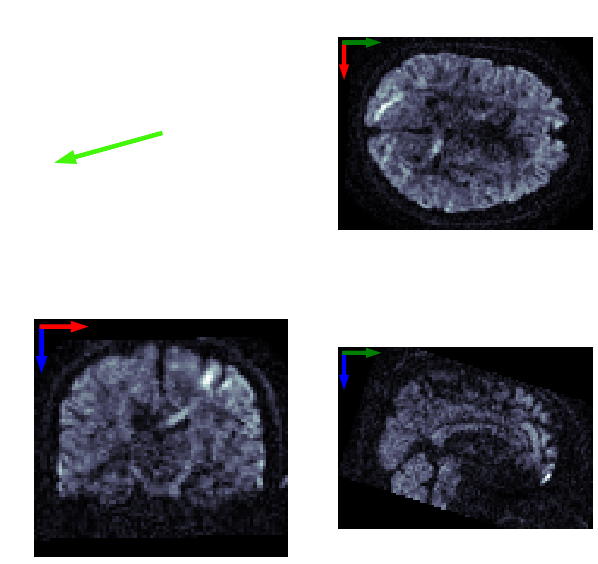

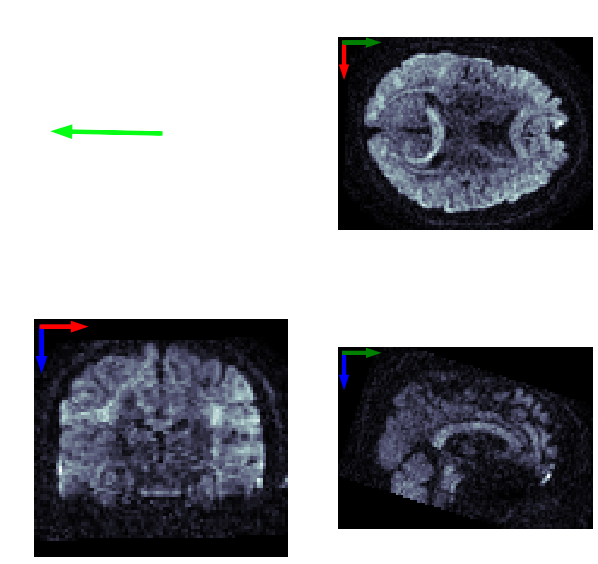

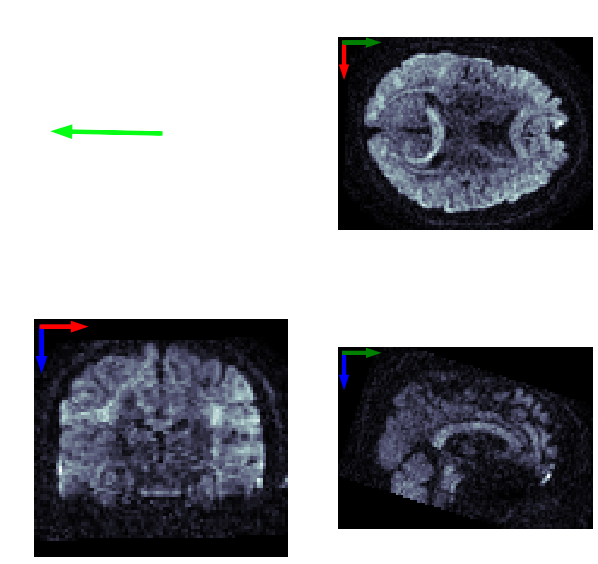

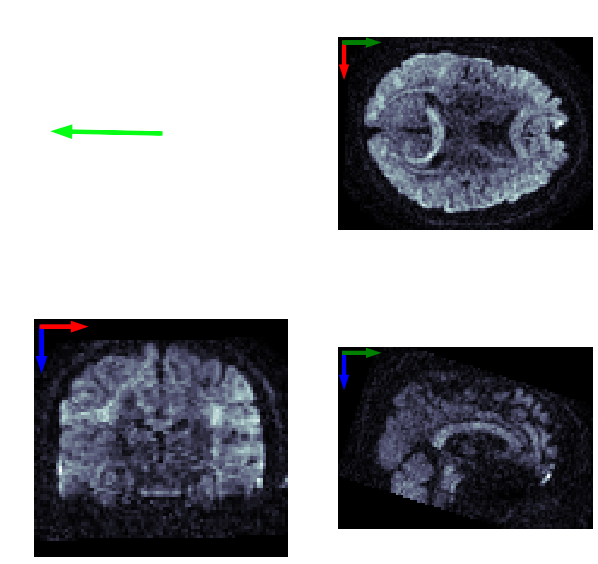

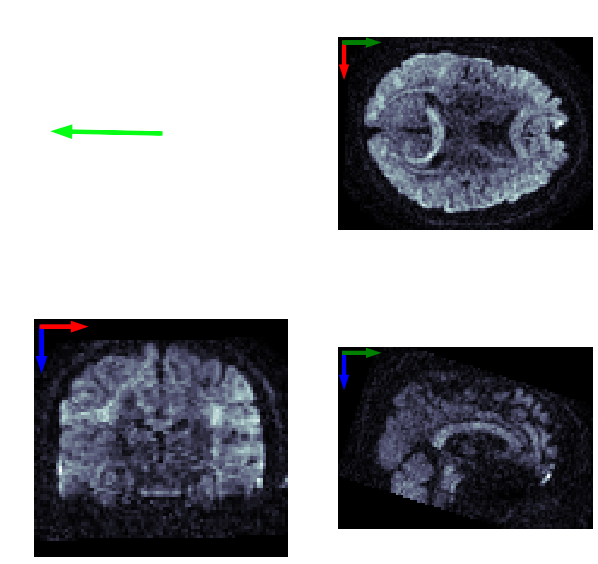

In [9]:
for ii, az in enumerate(np.arange(-90, 271, 2)):
    fig = plot_bvecs(elev=90, azim=az, x=40, y=50, z=35)
    fig.savefig('./figs-dMRI-signal/fig%03d'%(ii+1))

In [11]:
imseq = mp.ImageSequenceClip('./figs-dMRI-signal', fps=24)

In [12]:
imseq.write_videofile('./dMRI-signal-movie.mp4')

[MoviePy] >>>> Building video ./dMRI-signal-movie.mp4
[MoviePy] Writing video ./dMRI-signal-movie.mp4
[MoviePy] Done.
[MoviePy] >>>> Video ready: ./dMRI-signal-movie.mp4 

